# 3D Graphics Systems | AI Graphics - Theory and Practice | IMPA 2023
### Instructor: Luiz Velho
### TA: Hallison Paz
### Course info: https://lvelho.impa.br/i3d23/

## Lab Class #9 - Deform a source mesh to form a target mesh using 3D loss functions

---
#**Personal Info:**
*   **Student:**
    *   Sherlon Almeida da Silva
*   **Affiliation:**
    *   PhD Student
    *   University of São Paulo (USP)
    *   Institute of Mathematics and Computer Science (ICMC)
    *   Laboratory of Visualization, Imaging and Computer Graphics (VICG)
*   **Research & Programming:**
    *   [Lattes](http://lattes.cnpq.br/0000096258045504) | [ORCID](https://orcid.org/0000-0001-6124-9350) | [Google Scholar](https://scholar.google.com.br/citations?user=boFxo4gAAAAJ&hl=pt-BR) | [Linkedin](https://www.linkedin.com/in/SherlonAlmeida/) | [Github](https://github.com/SherlonAlmeida) | [Personal Page](http://vicg.icmc.usp.br/vicg/person/72/sherlon-almeida-da-silva)
---

## 0. Install and Import modules

Ensure `torch` and `torchvision` are installed. If `pytorch3d` is not installed, install it using the following cell:

In [1]:
import os
import sys
import torch
need_pytorch3d=False
try:
    import pytorch3d
except ModuleNotFoundError:
    need_pytorch3d=True
if need_pytorch3d:
    if torch.__version__.startswith(("1.13.", "2.0.")) and sys.platform.startswith("linux"):
        # We try to install PyTorch3D via a released wheel.
        pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
        version_str="".join([
            f"py3{sys.version_info.minor}_cu",
            torch.version.cuda.replace(".",""),
            f"_pyt{pyt_version_str}"
        ])
        !pip install fvcore iopath
        !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
    else:
        # We try to install PyTorch3D from source.
        !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 616.2 kB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61405 sha256=15d9d48e147f283c861a381be41bf918000ab58a0916dbd697c83b3d447d150e
  Stored in directory: /root/.cache/pip/wheels/01/c0/af/77c1cf53a1be9e42a52b48e5af2169d40ec2e89f7362489dd0
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31531 sha256=d25940f0744b3e9805bb49e0b3da0ce49da3504e80ffd66e172cc2fd8184b747
  Stored in directory: /root/.cache/pip/wheels/9a/a3/b6/ac0fcd1b4ed5cfeb3db92e6a0e476cfd48ed0df92b91080c1d
Successfully built fvcore iopath
Looking in links: https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/py310_cu118_pyt201/do

In [2]:
import os
import torch
from pytorch3d.io import load_obj, save_obj
from pytorch3d.structures import Meshes
from pytorch3d.utils import ico_sphere
from pytorch3d.ops import sample_points_from_meshes
from pytorch3d.loss import (
    chamfer_distance, 
    mesh_edge_loss, 
    mesh_laplacian_smoothing, 
    mesh_normal_consistency,
)
import numpy as np
from tqdm.notebook import tqdm
%matplotlib notebook 
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.rcParams['savefig.dpi'] = 80
mpl.rcParams['figure.dpi'] = 80

# Set the device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
else:
    device = torch.device("cpu")
    print("WARNING: CPU only, this will be slow!")

## 1. Load an obj file and create a Meshes object

Download the target 3D model of a dolphin. It will be saved locally as a file called `dolphin.obj`.

In [3]:
!wget https://dl.fbaipublicfiles.com/pytorch3d/data/dolphin/dolphin.obj

--2023-05-29 18:31:43--  https://dl.fbaipublicfiles.com/pytorch3d/data/dolphin/dolphin.obj
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.227.219.59, 13.227.219.10, 13.227.219.33, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.227.219.59|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 156763 (153K) [text/plain]
Saving to: ‘dolphin.obj’

dolphin.obj         100%[===================>] 153.09K  --.-KB/s    in 0.008s  

2023-05-29 18:31:43 (17.9 MB/s) - ‘dolphin.obj’ saved [156763/156763]



In [4]:
# Load the dolphin mesh.
trg_obj = os.path.join('dolphin.obj')

In [5]:
# We read the target 3D model using load_obj
verts, faces, aux = load_obj(trg_obj)

# verts is a FloatTensor of shape (V, 3) where V is the number of vertices in the mesh
# faces is an object which contains the following LongTensors: verts_idx, normals_idx and textures_idx
# For this tutorial, normals and textures are ignored.
faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

/usr/local/lib/python3.10/dist-packages/pytorch3d/io/obj_io.py:544: UserWarning: No mtl file provided
  warnings.warn("No mtl file provided")


In [6]:
# We initialize the source shape to be a sphere of radius 1
src_mesh = ico_sphere(4, device)
src_mesh

In [7]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh = Meshes(verts=[verts], faces=[faces_idx], textures=None, verts_normals=None)
target_mesh

In [8]:
from pytorch3d.vis.plotly_vis import AxisArgs, plot_batch_individually, plot_scene
from pytorch3d.vis.texture_vis import texturesuv_image_matplotlib

def show_plotly_side_by_side(mesh1, title1, mesh2, title2):
    # Render the plotly figure
    fig = plot_scene(
        plots= {
          title1: {
              "shapenet_mesh": mesh1
          },
          title2: {
              "shapenet_mesh": mesh2
          }
        },
        ncols = 2
    )
    fig.show()

In [9]:
#Observando as malhas antes da normalização
show_plotly_side_by_side(src_mesh, "Source Mesh", target_mesh, "Target Mesh")

1.1 The source mesh is a sphere of radius 1 centered at (0, 0, 0). To speed up the optimization process, we should scale normalize the target mesh and center it at the origin, making it fit the unit sphere. Do this operations with the `verts`tensor and create a `Meshes` object with the normalized vertices and the faces indices.

1.2 Visualize the source and target meshes using `Plotly` integration.

In [10]:
##############################################################################
# Code for 1.1 - 1.2
##############################################################################

In [11]:
#Calculando o centro da malha do Golfinho
center = verts.mean(0)
center

tensor([2.3951e-04, 3.4056e-01, 8.8234e-02], device='cuda:0')

In [12]:
#Realizando a translação da malha a partir do centro
verts_norm = verts - center

In [13]:
#Calculando a variação máxima do objeto para então normalizar
scale = max(verts_norm.abs().max(0)[0])
scale

tensor(0.3716, device='cuda:0')

In [14]:
#Normalizando a malha do Golfinho
verts_norm = verts_norm / scale

In [15]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_norm = Meshes(verts=[verts_norm], faces=[faces_idx], textures=None, verts_normals=None)
target_mesh_norm

In [16]:
#Comparando Vertices Antes e Depois da normalização
target_mesh.verts_list(), target_mesh_norm.verts_list()

([tensor([[-0.0374,  0.4473,  0.1219],
          [ 0.0377,  0.4471,  0.1220],
          [-0.0378,  0.2817,  0.0426],
          ...,
          [-0.0220,  0.2618, -0.1531],
          [-0.0226,  0.2818, -0.1400],
          [-0.0271,  0.2740, -0.1376]], device='cuda:0')],
 [tensor([[-0.1013,  0.2872,  0.0906],
          [ 0.1008,  0.2867,  0.0908],
          [-0.1025, -0.1584, -0.1229],
          ...,
          [-0.0599, -0.2120, -0.6493],
          [-0.0615, -0.1582, -0.6142],
          [-0.0734, -0.1792, -0.6077]], device='cuda:0')])

In [17]:
#Observando as malhas depois da normalização
show_plotly_side_by_side(src_mesh, "Source Mesh", target_mesh_norm, "Target Mesh")

###  Visualizing point clouds with Matplotlib

We can also sample points from the surfaces and visualize them using Matplotlib. It can be a useful to have a coarse estimation of the surface during iterations in the optimization process.

In [18]:
"""Essa é a função default de visualização de Malhas do tutorial do Pytorch 3D
   Link: https://pytorch3d.org/tutorials/deform_source_mesh_to_target_mesh
"""
def plot_pointcloud(mesh, title=""):
  # Sample points uniformly from the surface of the mesh.
  points = sample_points_from_meshes(mesh, 5000)
  x, y, z = points.clone().detach().cpu().squeeze().unbind(1)    
  fig = plt.figure(figsize=(5, 5))
  #ax = Axes3D(fig) #Essa função não funcionou pra mim
  ax = plt.axes(projection ="3d") #Adaptei com essa a seguir
  ax.scatter3D(x, z, -y)
  ax.set_xlabel('x')
  ax.set_ylabel('z')
  ax.set_zlabel('y')
  ax.set_title(title)
  ax.view_init(190, 30)
  plt.show()

In [19]:
import pandas as pd
import plotly.express as px
"""Essa é a minha versão interativa de visualização de Malahs usando Plotly"""
def plot_interactive_point_cloud(mesh):
  # Sample points uniformly from the surface of the mesh.
  points = sample_points_from_meshes(mesh, 5000)
  x, y, z = points.clone().detach().cpu().squeeze().unbind(1)
  df = pd.DataFrame([x.tolist(),y.tolist(),z.tolist()]).T
  df.columns = ["x", "y", "z"]
  fig = px.scatter_3d(df, x="x", y="z", z="y") #Inverti a ordem do Y e Z apenas para a visualização interativa ficar na "horizontal"
  fig.show()

1.3 Use the function `plot_pointcloud` to see the initial pointcloud

In [19]:
##############################################################################
# Code for 1.3
##############################################################################

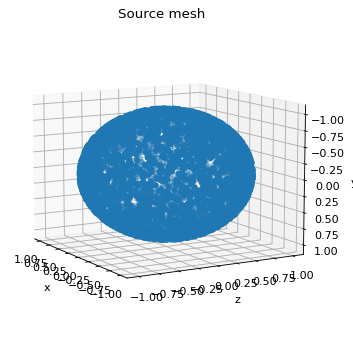

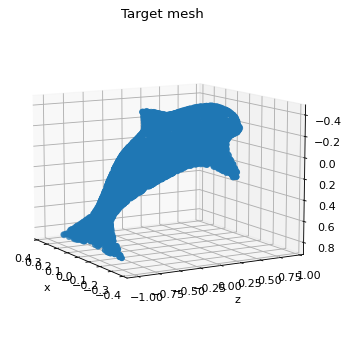

In [20]:
%matplotlib inline
plot_pointcloud(src_mesh, "Source mesh")
plot_pointcloud(target_mesh_norm, "Target mesh")

In [21]:
plot_interactive_point_cloud(src_mesh)
plot_interactive_point_cloud(target_mesh_norm)

## 2. Optimization loop 

Starting from a sphere mesh, we learn the offset to each vertex in the mesh such that the predicted mesh is closer to the target mesh at each optimization step. To achieve this we minimize the distance between the predicted (deformed) and target mesh, defined as the **chamfer distance** between the set of pointclouds resulting from **differentiably sampling points** from their surfaces.

However, solely minimizing the chamfer distance between the predicted and the target mesh will lead to a non-smooth shape. We enforce smoothness by adding **shape regularizers** to the objective. Namely, we add:

+ `mesh_edge_length`, which minimizes the length of the edges in the predicted mesh.
+ `mesh_normal_consistency`, which enforces consistency across the normals of neighboring faces.
+ `mesh_laplacian_smoothing`, which is the laplacian regularizer.
We will learn to deform the source mesh by offsetting its vertices

In [22]:
"""Função para realizara aproximação de um objeto "Source" em um objeto "Target"

Parâmetros:
    Niter: Number of optimization steps
    w_chamfer: Weight for the chamfer loss
    w_edge: Weight for mesh edge loss
    w_normal: Weight for mesh normal consistency
    w_laplacian: Weight for mesh laplacian smoothing
    plot_period: Plot period for the losses
"""
def object_approximation(src_mesh, target_mesh,  opt ="SGD", Niter = 5000, w_chamfer = 1.0, w_edge = 1.0, w_normal = 0.01, w_laplacian = 0.1, plot_period = 250):
    # The shape of the deform parameters is equal to the total number of vertices in src_mesh
    deform_verts = torch.full(src_mesh.verts_packed().shape, 0.0, device=device, requires_grad=True)
    
    # The optimizer
    if opt == "SGD": #Documentation: https://pytorch.org/docs/stable/generated/torch.optim.SGD.html#torch.optim.SGD
        optimizer = torch.optim.SGD([deform_verts], lr=1.0, momentum=0.9)
    elif opt == "Adam": #Documentation: https://pytorch.org/docs/stable/generated/torch.optim.Adam.html#torch.optim.Adam
        optimizer = torch.optim.Adam([deform_verts], lr=0.05)
    elif opt == "RMSProp": #Documentation: https://pytorch.org/docs/stable/generated/torch.optim.RMSprop.html#torch.optim.RMSprop
        optimizer = torch.optim.RMSprop([deform_verts], lr=0.05)

    loop = tqdm(range(Niter))

    chamfer_losses = []
    laplacian_losses = []
    edge_losses = []
    normal_losses = []

    %matplotlib inline

    for i in loop:
        # Initialize optimizer (Garantir que não está acumulando)
        optimizer.zero_grad()
        
        # Deform the mesh
        new_src_mesh = src_mesh.offset_verts(deform_verts)
        
        # We sample 5k points from the surface of each mesh 
        sample_trg = sample_points_from_meshes(target_mesh, 5000)
        sample_src = sample_points_from_meshes(new_src_mesh, 5000)
        
        # We compare the two sets of pointclouds by computing (a) the chamfer loss
        loss_chamfer, _ = chamfer_distance(sample_trg, sample_src)
        
        # and (b) the edge length of the predicted mesh
        loss_edge = mesh_edge_loss(new_src_mesh)
        
        # mesh normal consistency
        loss_normal = mesh_normal_consistency(new_src_mesh)
        
        # mesh laplacian smoothing
        loss_laplacian = mesh_laplacian_smoothing(new_src_mesh, method="uniform")
        
        # Weighted sum of the losses
        loss = loss_chamfer * w_chamfer + loss_edge * w_edge + loss_normal * w_normal + loss_laplacian * w_laplacian
        
        # Print the losses
        loop.set_description('total_loss = %.6f' % loss)
        
        # Save the losses for plotting
        chamfer_losses.append(loss_chamfer)
        edge_losses.append(loss_edge)
        normal_losses.append(loss_normal)
        laplacian_losses.append(loss_laplacian)
        
        # Plot mesh after each `plot_period` iterations
        if i % plot_period == 0:
            plot_pointcloud(new_src_mesh, title="iter: %d" % i)
            
        # Optimization step
        loss.backward()  #Calcula o gradiente em relação à loss
        optimizer.step() #Atualiza
    
    #Transformando as "Losses" da GPU para a CPU
    chamfer_losses_cpu = [loss.tolist() for loss in chamfer_losses]
    laplacian_losses_cpu = [loss.tolist() for loss in laplacian_losses]
    edge_losses_cpu = [loss.tolist() for loss in edge_losses]
    normal_losses_cpu = [loss.tolist() for loss in normal_losses]

    #Criando o dicionado com os dados a serem plotados
    losses = {"chamfer loss": chamfer_losses_cpu,
              "edge loss": edge_losses_cpu,
              "normal loss": normal_losses_cpu,
              "laplacian loss": laplacian_losses_cpu}
    
    return losses, new_src_mesh

  0%|          | 0/5000 [00:00<?, ?it/s]

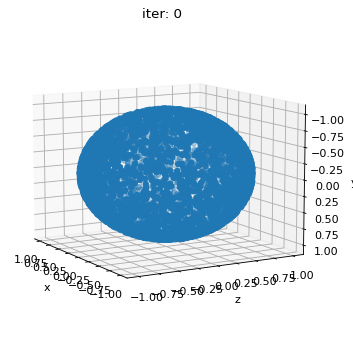

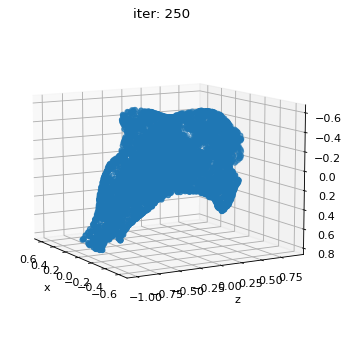

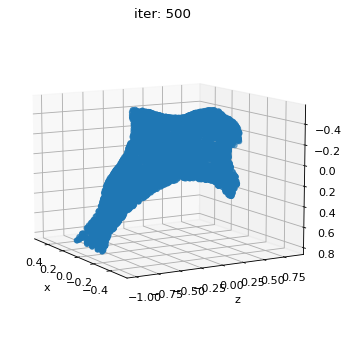

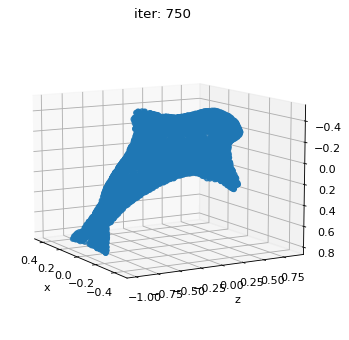

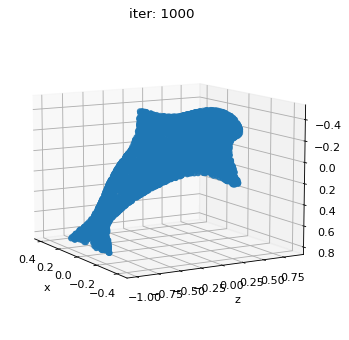

...

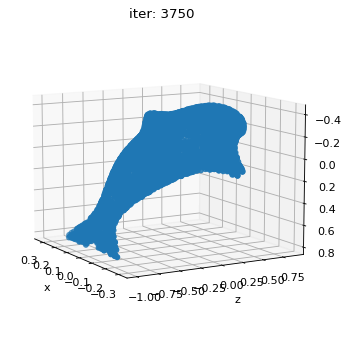

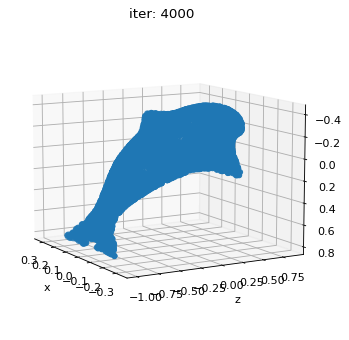

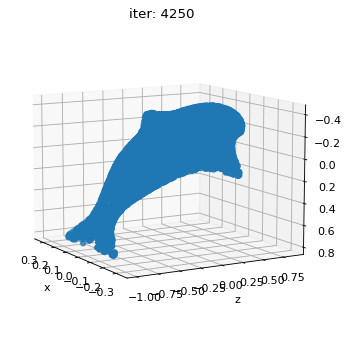

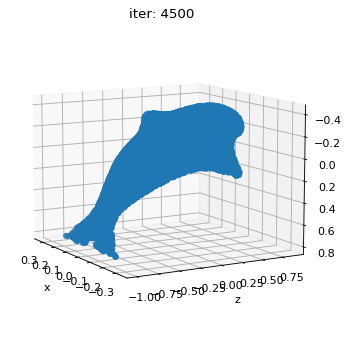

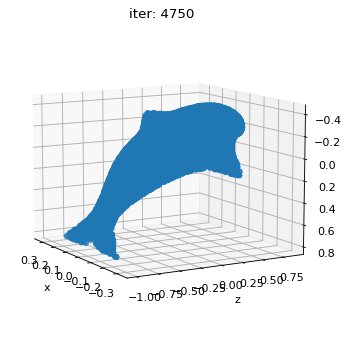

In [23]:
#Executando a função de aproximação (Configurações iniciais dadas)
losses, new_src_mesh = object_approximation(src_mesh, target_mesh_norm)

## Visualize the loss

In [24]:
#Dica: Os tensores precisam estar na CPU, então ou copiar da GPU ou armazenar sempre na CPU.
def plot_losses(loss_dict, size=(13,5)):
  fig = plt.figure(figsize=size)
  ax = fig.gca()
  for loss_name, loss_values in loss_dict.items():
    ax.plot(loss_values, label=loss_name)
  ax.legend(fontsize="16")
  ax.set_xlabel("Iteration", fontsize="16")
  ax.set_ylabel("Loss", fontsize="16")
  ax.set_title("Loss vs iterations", fontsize="16");

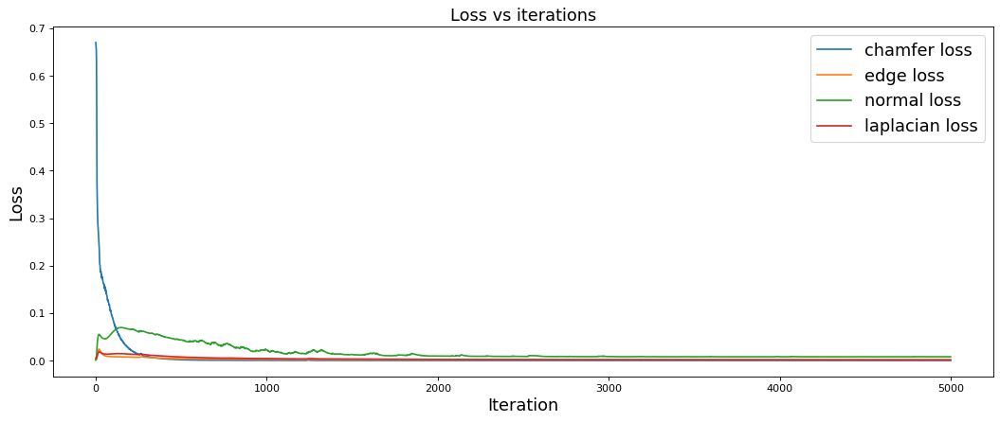

In [25]:
#Plotando as Losses
plot_losses(losses, (16, 6))

## Save the predicted mesh

In [26]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

2.1 Scale normalize back the `final_verts` to the original target size



In [27]:
##############################################################################
# Code for 2.1
##############################################################################

In [28]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(0.4933, device='cuda:0')

In [29]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(0.9769, device='cuda:0', grad_fn=<UnbindBackward0>)

In [30]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [31]:
#Verificando a escala do objeto APROXIMADO após a normalização
max(final_verts_norm.abs().max(0)[0])

tensor(0.4933, device='cuda:0', grad_fn=<UnbindBackward0>)

In [32]:
# Store the predicted mesh using save_obj
final_obj = os.path.join('./', 'final_model.obj')
save_obj(final_obj, final_verts_norm, final_faces)

2.2 Visualize the target mesh and the final mesh using `Plotly`. Qualitatively, what do you think of the result?


In [ ]:
##############################################################################
# Code for 2.1 - 2.5
##############################################################################

In [33]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [34]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Target Mesh", target_mesh_final, "Generated Target Mesh")

**Observations:**

The result of the generated object looks accurate, although the sharpened parts are not fully represented. This approximation method seems to be useful in various scenarios.

2.3 Take a look at the **Loss vs Iteration** graph, paying attention to how the losses are decreasing. Do you think it would be possible to achieve a reasonable result with less iterations? Is it worth to run with more iterations? Explain you thoughts, then run the optimization loop again making the changes to validate your hypothesis.

**Observations:**

According to the Loss vs Iteration graph, it is possible to observe that the chamfer loss converges close to 200 iterations. In my opinion, it is not necessary to run for more iterations, even though the normal loss only converges near 2000 iterations. Below, you can see the results of only 1000 iterations, and they seem to be reasonable.

  0%|          | 0/1000 [00:00<?, ?it/s]

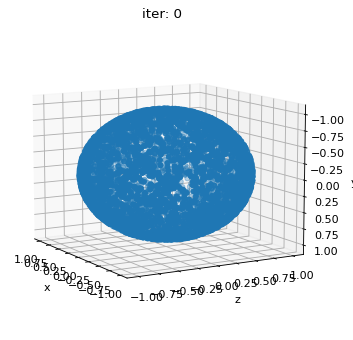

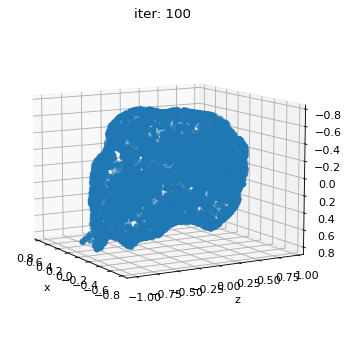

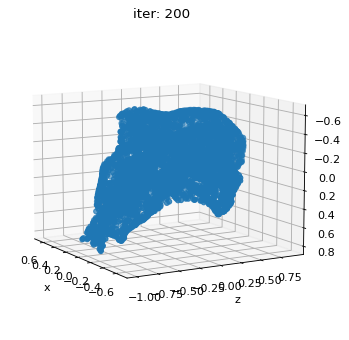

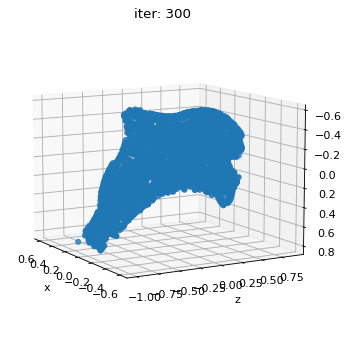

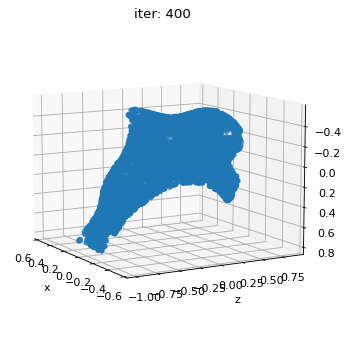

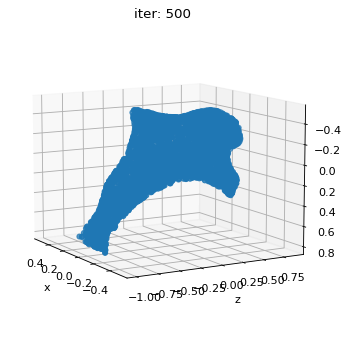

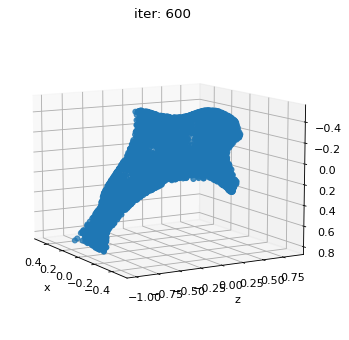

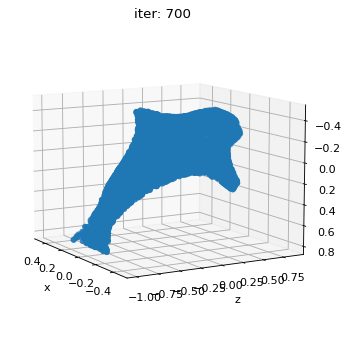

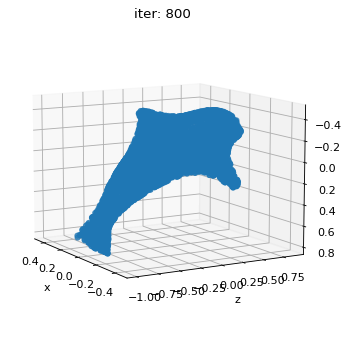

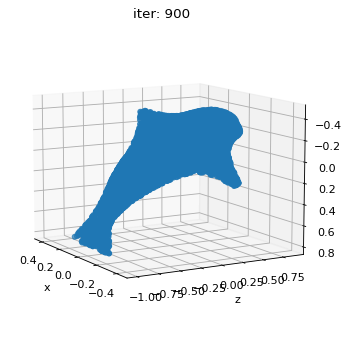

In [35]:
#Executando a função de aproximação (Usando menos iterações)
losses, new_src_mesh = object_approximation(src_mesh, target_mesh_norm, Niter = 1000, plot_period = 100)

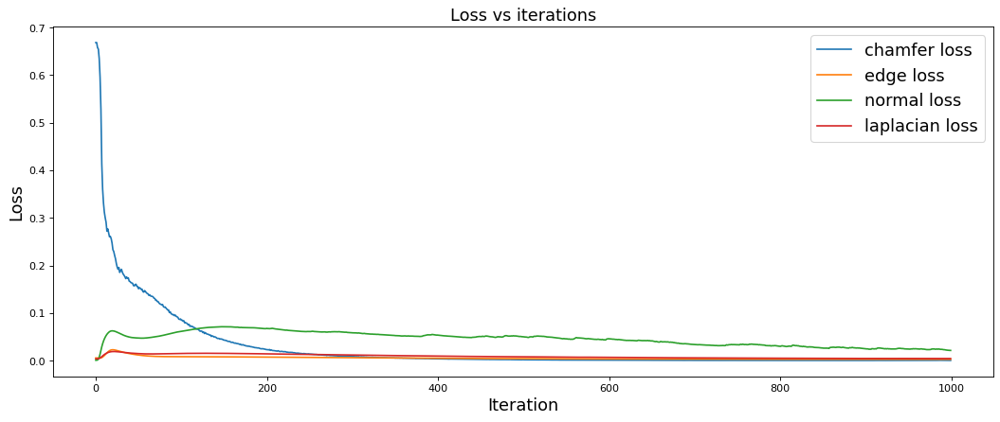

In [36]:
#Plotando as Losses
plot_losses(losses, (16, 6))

In [37]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

In [38]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(0.4933, device='cuda:0')

In [39]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(0.9826, device='cuda:0', grad_fn=<UnbindBackward0>)

In [40]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [41]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [42]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Target Mesh", target_mesh_final, "Generated Target Mesh")

2.4 The loss function used for this task is a linear combination of four losses. Let `w_chamfer = 1.0` and set the other coefficients to zero. Run the  optimization loop again with this configuration and describe the result. 

**[EXTRA] E.1 Experiment other coefficients configurations and describe the results.**

  0%|          | 0/1000 [00:00<?, ?it/s]

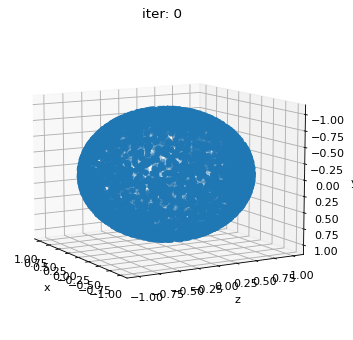

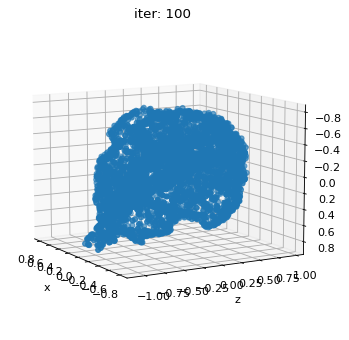

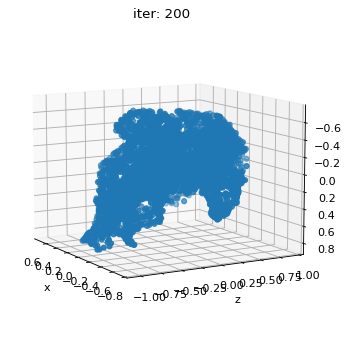

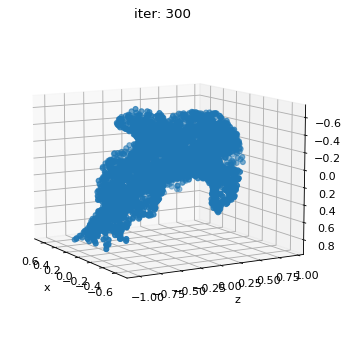

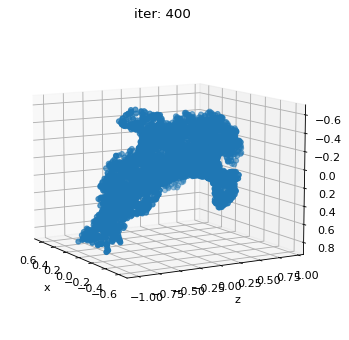

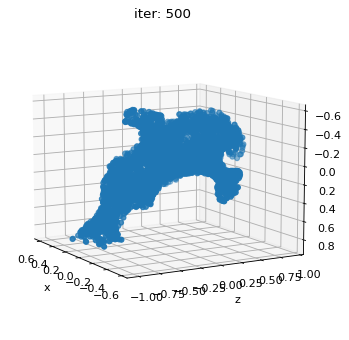

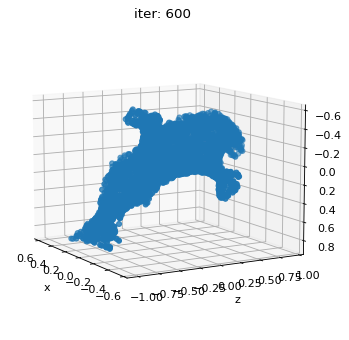

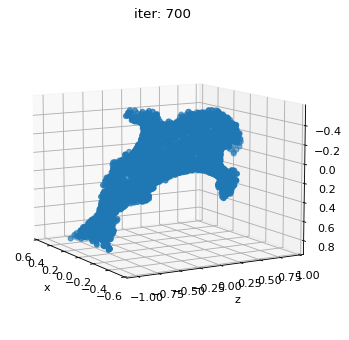

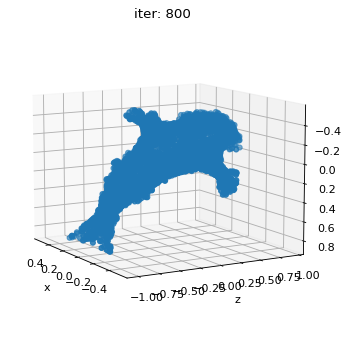

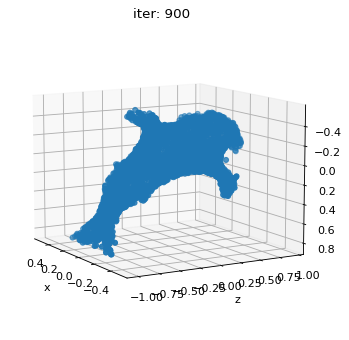

In [43]:
#Executando a função de aproximação (Usando menos iterações e variando os coeficientes)
losses, new_src_mesh = object_approximation(src_mesh, target_mesh_norm, Niter = 1000, w_chamfer = 1.0, w_edge = 0.0, w_normal = 0.00, w_laplacian = 0.0, plot_period = 100)

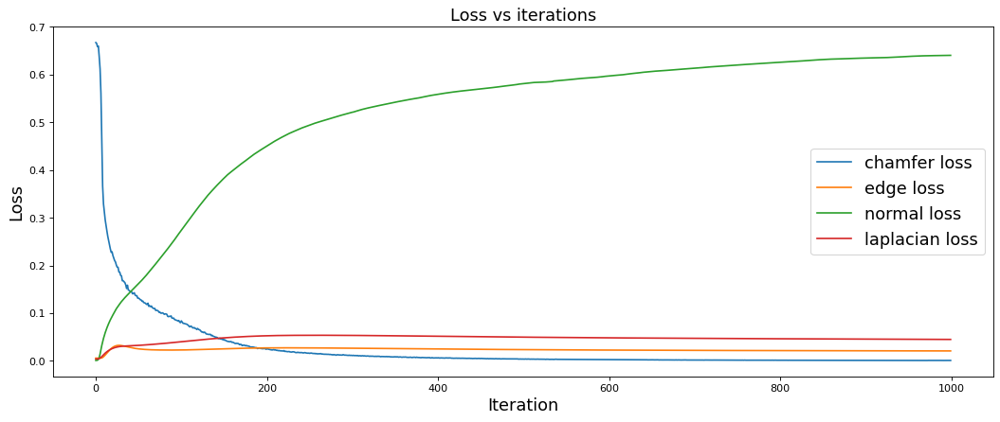

In [44]:
#Plotando as Losses
plot_losses(losses, (16, 6))

In [45]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

In [46]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(0.4933, device='cuda:0')

In [47]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(1.0029, device='cuda:0', grad_fn=<UnbindBackward0>)

In [48]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [49]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [50]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Target Mesh", target_mesh_final, "Generated Target Mesh")

**Observations:**

By changing the coefficients, the result is completely different! Although the shape is similar to the original one, the orientation of the polygons is inaccurate. Upon observing the result and the graph depicting the losses, I noticed a significant impact on the normals. Therefore, the main important lesson from this experiment was that optimization must consider various aspects of the original object in order to accurately approximate it.

2.5 Experiment with others optimizers such as `Adam` and `RMSprop` in place of `SGD`. Also, try changing the learning rate (`lr`), and `momentum` when these parameters are applied. What do you observe in terms of speed of convergence and quality of final results?

**Using Adam Optimizer**

  0%|          | 0/1000 [00:00<?, ?it/s]

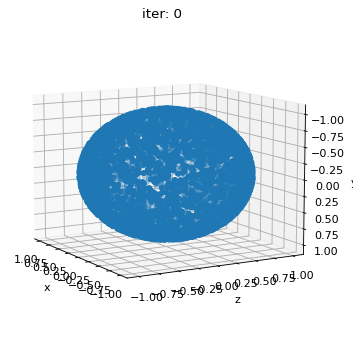

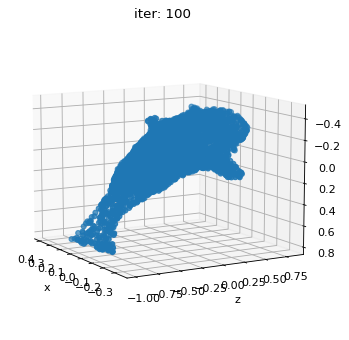

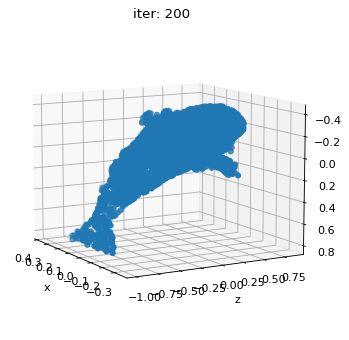

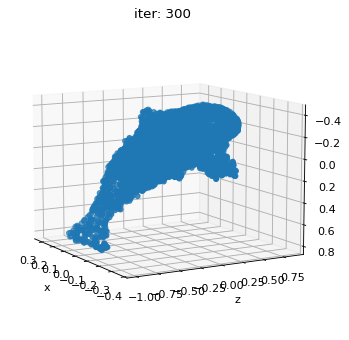

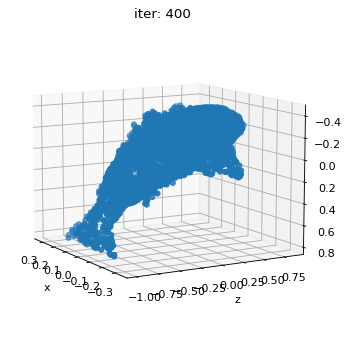

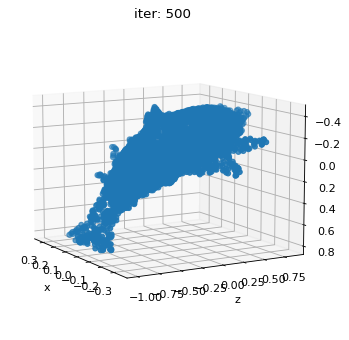

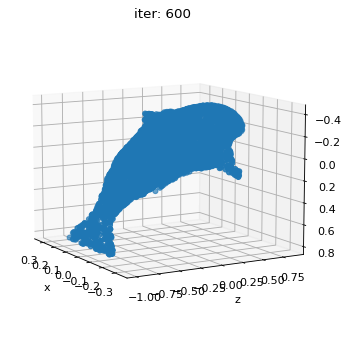

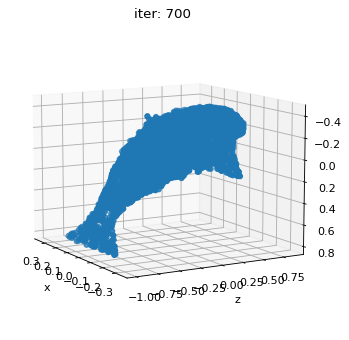

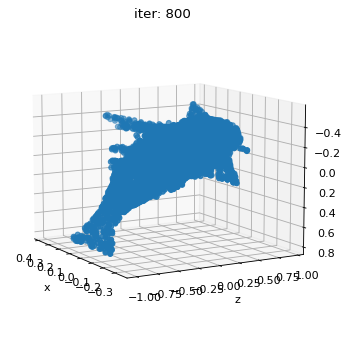

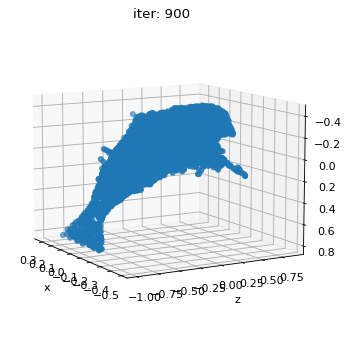

In [51]:
#Executando a função de aproximação (Usando menos iterações e usando o otimizador Adam)
losses, new_src_mesh = object_approximation(src_mesh, target_mesh_norm, opt="Adam", Niter = 1000, plot_period = 100)

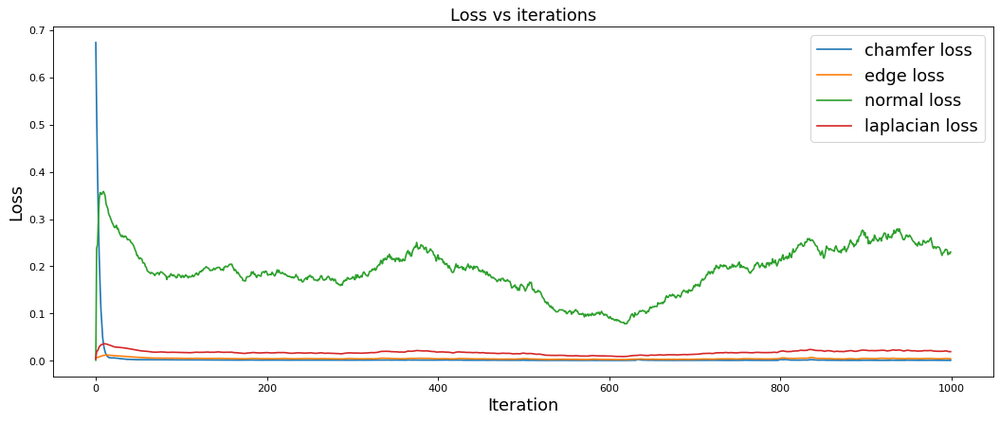

In [52]:
#Plotando as Losses
plot_losses(losses, (16, 6))

In [53]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

In [54]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(0.4933, device='cuda:0')

In [55]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(0.9959, device='cuda:0', grad_fn=<UnbindBackward0>)

In [56]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [57]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [58]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Target Mesh", target_mesh_final, "Generated Target Mesh")

**Using RMSProp Optimizer**

  0%|          | 0/1000 [00:00<?, ?it/s]

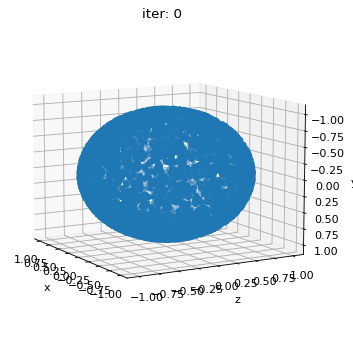

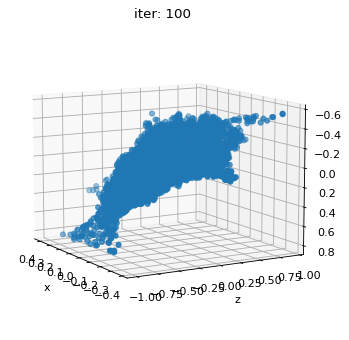

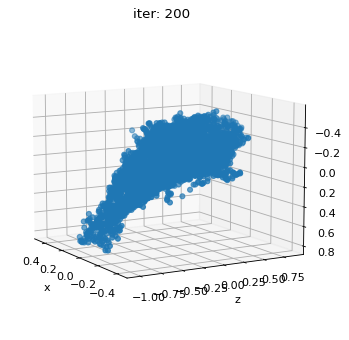

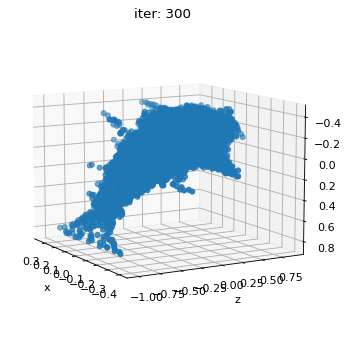

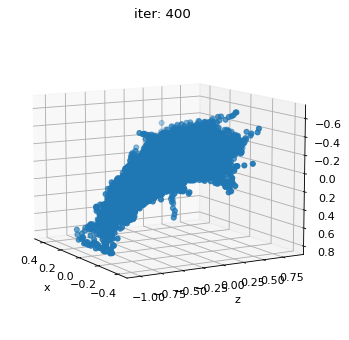

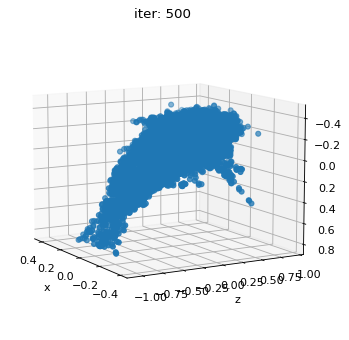

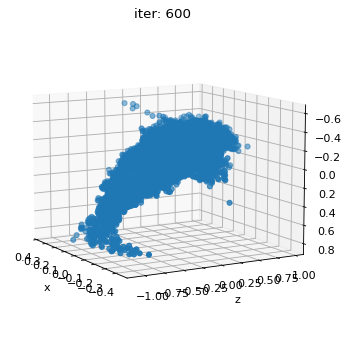

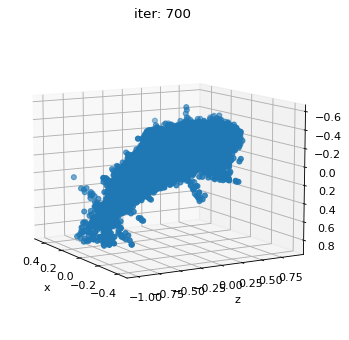

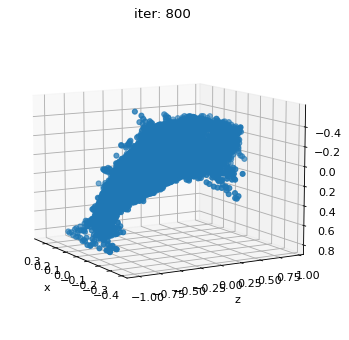

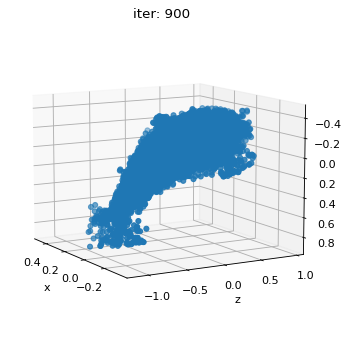

In [59]:
#Executando a função de aproximação (Usando menos iterações e usando o otimizador RMSProp)
losses, new_src_mesh = object_approximation(src_mesh, target_mesh_norm, opt="RMSProp", Niter = 1000, plot_period = 100)

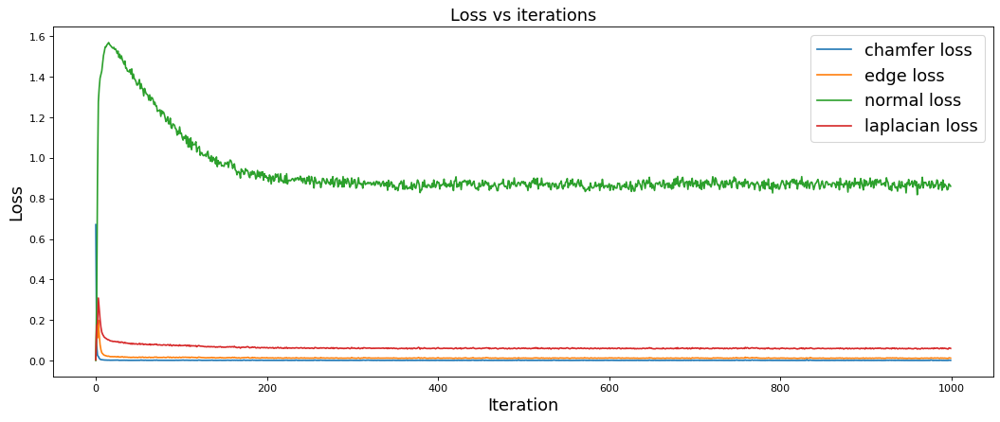

In [60]:
#Plotando as Losses
plot_losses(losses, (16, 6))

In [61]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

In [62]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(0.4933, device='cuda:0')

In [63]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(1.0692, device='cuda:0', grad_fn=<UnbindBackward0>)

In [64]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [65]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [66]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Target Mesh", target_mesh_final, "Generated Target Mesh")

# 3. Experimenting with Other Shapes

In [67]:
# download the mug model - Mug by Microsoft is licensed under Creative Commons Attribution
# originally found at https://sketchfab.com/3d-models/mug-17c4808537f1448590378b3643c6da72
!wget https://raw.githubusercontent.com/hallpaz/3dsystems21/main/data/mug.obj

--2023-05-29 18:48:41--  https://raw.githubusercontent.com/hallpaz/3dsystems21/main/data/mug.obj
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 525932 (514K) [text/plain]
Saving to: ‘mug.obj’

mug.obj             100%[===================>] 513.61K  --.-KB/s    in 0.01s   

2023-05-29 18:48:41 (36.9 MB/s) - ‘mug.obj’ saved [525932/525932]



3.1 Is it possible to deform any mesh into another? Explain your thoughts.

**Observations:**
In my opinion, it is possible to deform one object into another, but it is important to consider the properties of the faces to avoid unsuitable shapes. For instance, fitting a human into another human or a car into another car may be a relatively easier and more accurate task compared to attempting to fit a torus into a human.

3.2 Run the experiment again and try to deform a sphere into a mug.

In [ ]:
##############################################################################
# Code for 3.1 - 3.3
##############################################################################

In [68]:
# Load the dolphin mesh.
trg_obj = os.path.join('mug.obj')

In [69]:
# We read the target 3D model using load_obj
verts, faces, aux = load_obj(trg_obj)

# verts is a FloatTensor of shape (V, 3) where V is the number of vertices in the mesh
# faces is an object which contains the following LongTensors: verts_idx, normals_idx and textures_idx
# For this tutorial, normals and textures are ignored.
faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

/usr/local/lib/python3.10/dist-packages/pytorch3d/io/obj_io.py:548: UserWarning:

Mtl file does not exist: Mug.mtl



In [70]:
# We initialize the source shape to be a sphere of radius 1
src_mesh = ico_sphere(4, device)
src_mesh

In [71]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh = Meshes(verts=[verts], faces=[faces_idx], textures=None, verts_normals=None)
target_mesh

In [72]:
#Observando as malhas antes da normalização
show_plotly_side_by_side(src_mesh, "Source Mesh", target_mesh, "Target Mesh")

In [73]:
#Calculando o centro da malha da Caneca
center = verts.mean(0)
center

tensor([4.1824e+00, 1.3233e+01, 6.6922e-04], device='cuda:0')

In [74]:
#Realizando a translação da malha a partir do centro
verts_norm = verts - center

In [75]:
#Calculando a variação máxima do objeto para então normalizar
scale = max(verts_norm.abs().max(0)[0])
scale

tensor(14.1800, device='cuda:0')

In [76]:
#Normalizando a malha da Caneca
verts_norm = verts_norm / scale

In [77]:
#Cria um objeto do tipo "Meshes" da Caneca para ser usado no plotly a seguir
target_mesh_norm = Meshes(verts=[verts_norm], faces=[faces_idx], textures=None, verts_normals=None)
target_mesh_norm

In [78]:
#Comparando Vertices Antes e Depois da normalização
target_mesh.verts_list(), target_mesh_norm.verts_list()

([tensor([[ 9.8469,  4.8470,  1.7476],
          [ 9.8457,  5.0000,  1.7543],
          [ 9.6143,  1.2500,  2.7399],
          ...,
          [14.2355,  5.3961, -1.7457],
          [-2.8423,  2.9465,  6.6277],
          [14.8961, 17.1539, -1.1206]], device='cuda:0')],
 [tensor([[ 0.3995, -0.5914,  0.1232],
          [ 0.3994, -0.5806,  0.1237],
          [ 0.3831, -0.8451,  0.1932],
          ...,
          [ 0.7090, -0.5527, -0.1232],
          [-0.4954, -0.7255,  0.4674],
          [ 0.7555,  0.2765, -0.0791]], device='cuda:0')])

In [79]:
#Observando as malhas antes da normalização
show_plotly_side_by_side(src_mesh, "Source Mesh", target_mesh_norm, "Target Mesh")

  0%|          | 0/5000 [00:00<?, ?it/s]

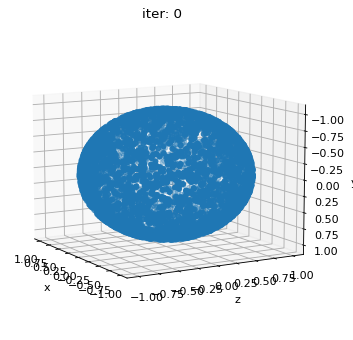

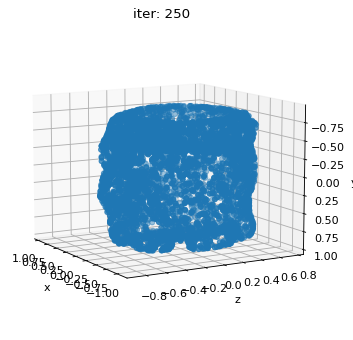

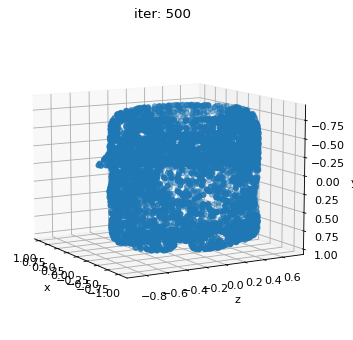

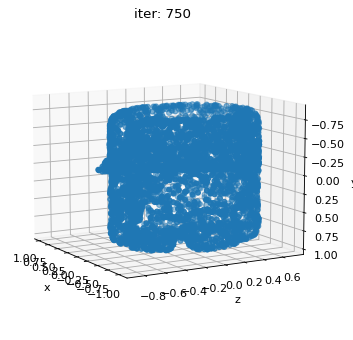

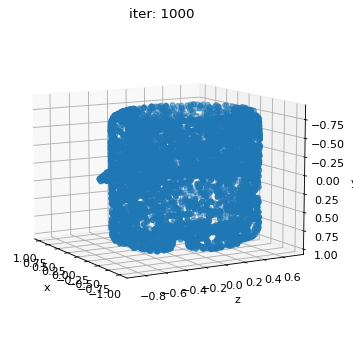

...

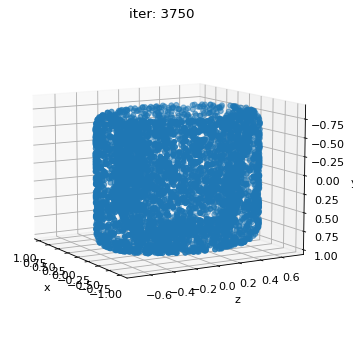

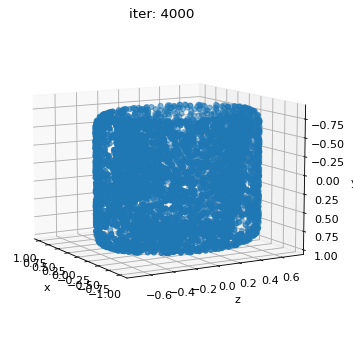

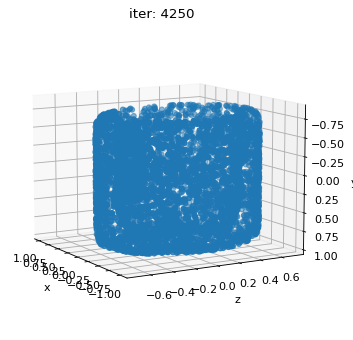

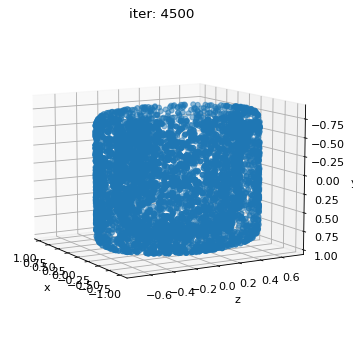

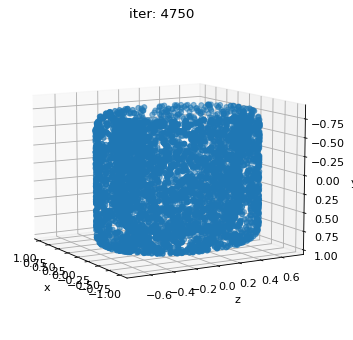

In [80]:
#Executando a função de aproximação (Configurações iniciais dadas)
losses, new_src_mesh = object_approximation(src_mesh, target_mesh_norm)

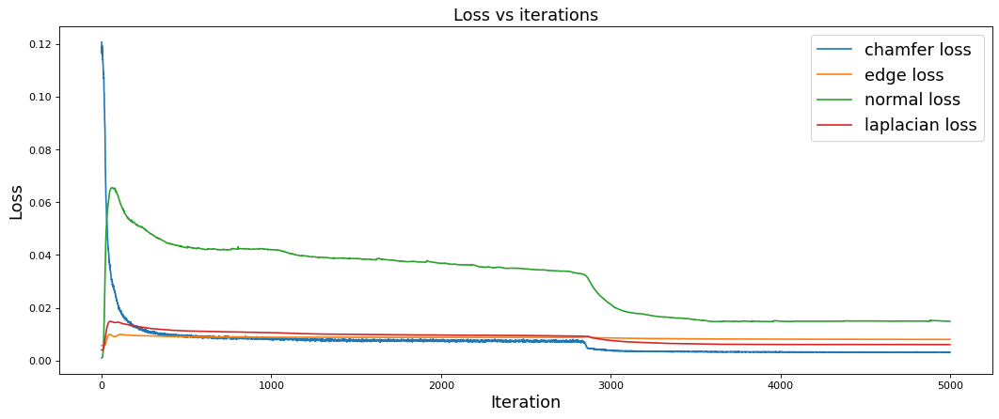

In [81]:
#Plotando as Losses
plot_losses(losses, (16, 6))

In [82]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

In [83]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(25., device='cuda:0')

In [84]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(1.0133, device='cuda:0', grad_fn=<UnbindBackward0>)

In [85]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [86]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [87]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Tarrget Mesh", target_mesh_final, "Generated Target Mesh")

**Observations:**

The generated object does not have "holes", which are a fundamental part of a mug handle. Therefore, it is not appropriate to approximate objects with this type of shape using a sphere, as it does not have "empty" spaces.

3.3 Change the `src_mesh` to a `torus`. You can import the torus primitive from `pytorch3d.utils`. Now, try to deform the torus into a mug.


**[Extra] E.2 Run the experiments again using other shapes (either find and download shapes from the internet or create your own models).**

In [88]:
# Load the mug mesh.
trg_obj = os.path.join('mug.obj')

In [89]:
# We read the target 3D model using load_obj
verts, faces, aux = load_obj(trg_obj)

# verts is a FloatTensor of shape (V, 3) where V is the number of vertices in the mesh
# faces is an object which contains the following LongTensors: verts_idx, normals_idx and textures_idx
# For this tutorial, normals and textures are ignored.
faces_idx = faces.verts_idx.to(device)
verts = verts.to(device)

In [90]:
from pytorch3d.utils import torus

# Specify the parameters of the torus
radius = 1.0  # Radius of the torus
tube_radius = 4.5  # Radius of the tube
sides = 64  # Number of sides (segments) of the torus
rings = 32  # Number of rings (segments) of the torus

# Generate the torus mesh
torus_mesh = torus(r=radius, R=tube_radius, sides=sides, rings=rings)

# Access the vertices and faces of the torus
vertices = torus_mesh.verts_packed().to(device)
faces = torus_mesh.faces_packed().to(device)

In [91]:
#Calculando o centro da malha da Caneca
center = vertices.mean(0)
center

tensor([-1.7222e-17,  1.7222e-17,  1.9135e-18], device='cuda:0')

In [92]:
#Realizando a translação da malha a partir do centro
verts_norm = vertices - center

In [93]:
#Calculando a variação máxima do objeto para então normalizar
scale = max(verts_norm.abs().max(0)[0])
scale

tensor(5.5000, device='cuda:0')

In [94]:
#Normalizando a malha do Torus
verts_norm = verts_norm / scale

In [95]:
#Cria um objeto do tipo "Meshes" do Torus para ser usado no plotly a seguir
src_mesh_norm = Meshes(verts=[verts_norm], faces=[faces], textures=None, verts_normals=None)
src_mesh_norm

In [96]:
#Calculando o centro da malha da Caneca
center = verts.mean(0)
center

tensor([4.1824e+00, 1.3233e+01, 6.6922e-04], device='cuda:0')

In [97]:
#Realizando a translação da malha a partir do centro
verts_norm = verts - center

In [98]:
#Calculando a variação máxima do objeto para então normalizar
scale = max(verts_norm.abs().max(0)[0])
scale

tensor(14.1800, device='cuda:0')

In [99]:
#Normalizando a malha da Caneca
verts_norm = verts_norm / scale

In [100]:
#Cria um objeto do tipo "Meshes" da Caneca para ser usado no plotly a seguir
target_mesh_norm = Meshes(verts=[verts_norm], faces=[faces_idx], textures=None, verts_normals=None)
target_mesh_norm

In [101]:
#Observando as malhas depois da normalização
show_plotly_side_by_side(src_mesh_norm, "Source Mesh", target_mesh_norm, "Target Mesh")

  0%|          | 0/5000 [00:00<?, ?it/s]

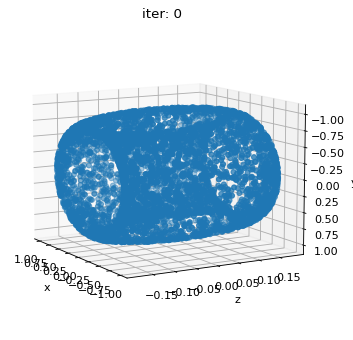

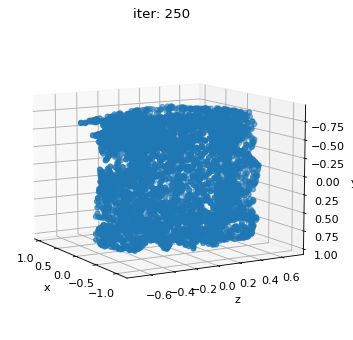

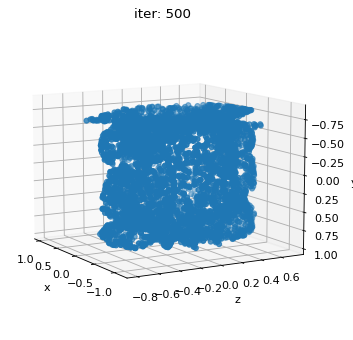

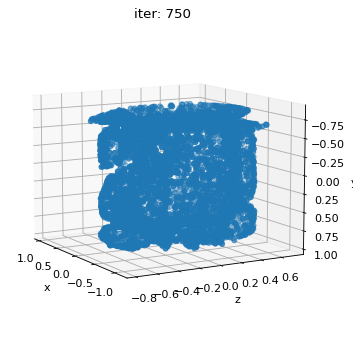

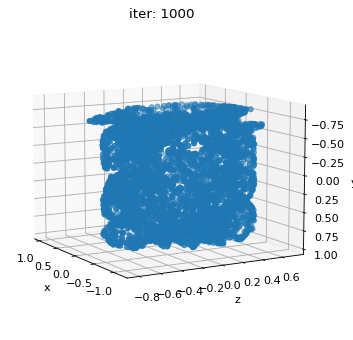

...

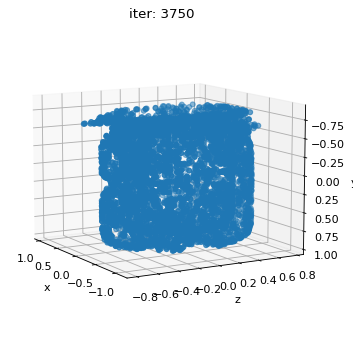

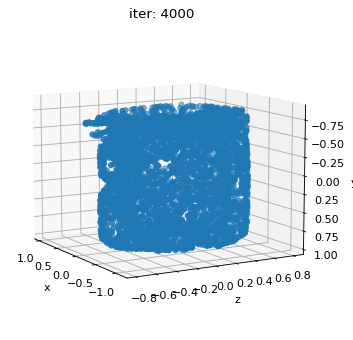

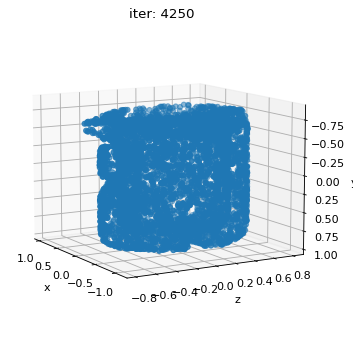

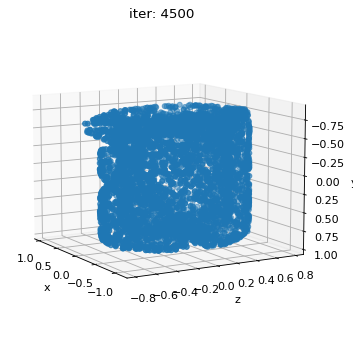

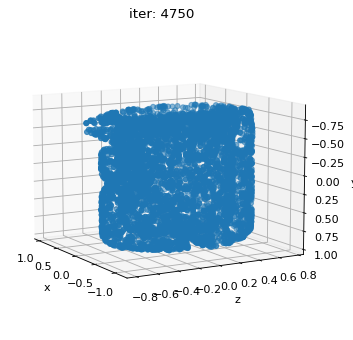

In [102]:
#Executando a função de aproximação (Configurações iniciais dadas)
losses, new_src_mesh = object_approximation(src_mesh_norm, target_mesh_norm)

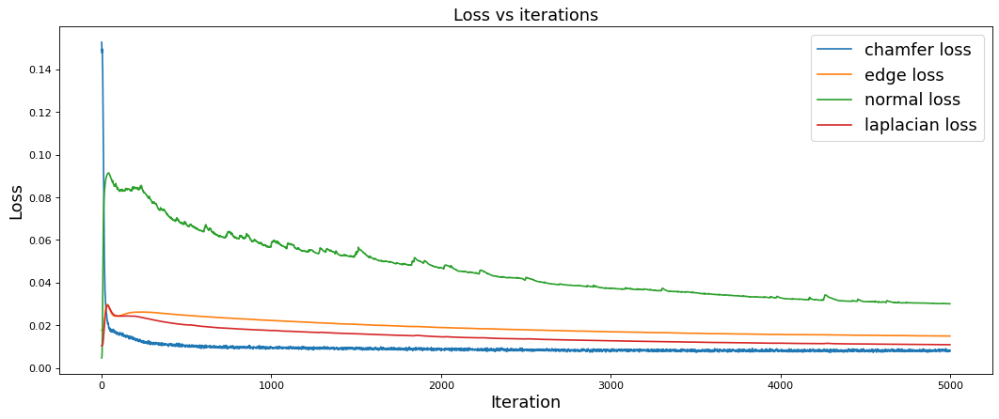

In [103]:
#Plotando as Losses
plot_losses(losses, (16, 6))

In [104]:
# Fetch the verts and faces of the final predicted mesh
final_verts, final_faces = new_src_mesh.get_mesh_verts_faces(0)

In [105]:
#Calculando a variação máxima do objeto ORIGINAL
original_scale = max(verts.abs().max(0)[0])
original_scale

tensor(25., device='cuda:0')

In [106]:
#Calculando a variação máxima do objeto APROXIMADO
new_obj_scale = max(final_verts.abs().max(0)[0])
new_obj_scale

tensor(1.1576, device='cuda:0', grad_fn=<UnbindBackward0>)

In [107]:
#Normalizando a malha final
final_verts_norm = final_verts / new_obj_scale #Primeiro padronizando a escala em 1
final_verts_norm = final_verts_norm * original_scale #Agora retornando a escala na original (inicial)

In [108]:
#Cria um objeto do tipo "Meshes" do Golfinho para ser usado no plotly a seguir
target_mesh_final = Meshes(verts=[final_verts_norm], faces=[final_faces], textures=None, verts_normals=None)
target_mesh_final

In [109]:
#Observando as malhas finais (original x gerada)
show_plotly_side_by_side(target_mesh, "Original Target Mesh", target_mesh_final, "Generated Target Mesh")

**Observations:**

The generated object has a "hole," which is a fundamental part of a mug handle. However, the final object is not similar to the original one. Was it necessary to use different parameters? Is it important to rotate the torus to best fit the mug?

Although the optimization technique can shift each vertex in the source object to fit the target object, achieving good results often requires different parameters. These parameters include the loss coefficients, the optimizer (along with its parameters), and a thoughtful choice of the source object. Additionally, rotating the source object appropriately can be crucial in order to achieve the best fit for the mug.

# 4. Food for Thoughts

Let's say you have a big set Ω of arbitrary meshes, and 1 mesh or a small set Δ of meshes, for example from the same class, that you are instered in. How would you solve the problem of fitting meshes from Ω to meshes in Δ? 

**Observations:**

Considering that the Δ objects (target) belong to the same class, we can assume that they share similarities in certain shape aspects. It is possible that some objects in Ω (source) are better suited to fit with the target meshes. Therefore, I propose investigating which ones are the most suitable to avoid an O(n^2) execution. By identifying the most promising candidates in Ω, we can focus our efforts on those meshes that have a higher potential for a good fit.